In [1]:
import sys
sys.path.append('../')
from PINN_Survey.problems.burgers.data.load import load_burgers_bounds
from PINN_Survey.problems.burgers.v1 import Burgers, Burgers_Domain_Transformer,Burgers_Soft_Mesh
import numpy as np
import matplotlib.pyplot as plt

In [2]:
X_true, U_true, X_bounds, U_bounds, [x,t,u] = load_burgers_bounds()

In [3]:
X = np.vstack(X_bounds)
U = np.vstack(U_bounds)

idx = np.random.choice( list(range(X_true.shape[0])), size=10000 )

X_df = X_true[idx,:]

lower_bound = np.min(X_true,axis=0)
upper_bound = np.max(X_true,axis=0)

In [6]:
model = Burgers(lower_bound,upper_bound, [2,20,20,20,20,20,20,20,20,1], .01/np.pi)
model.train_BFGS(X,U,X_df,True)

U_hat = model.predict(X_true)

print("RMSE", np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print("Relative Error", np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.000010
  Number of iterations: 5438
  Number of functions evaluations: 6006
RMSE 0.020767083208626604
Relative Error 0.033804029115711516


In [7]:
model = Burgers_Soft_Mesh(lower_bound,upper_bound,[2,20,20,1],[2,20,20,20,20],0.01/np.pi)

In [8]:
model.train_BFGS(X,U,X_df,True)

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.000006
  Number of iterations: 6420
  Number of functions evaluations: 6837


In [12]:
U_hat = model.predict(X_true)

print( np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print( np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))

0.0010350600109202393
0.0016848393389747682


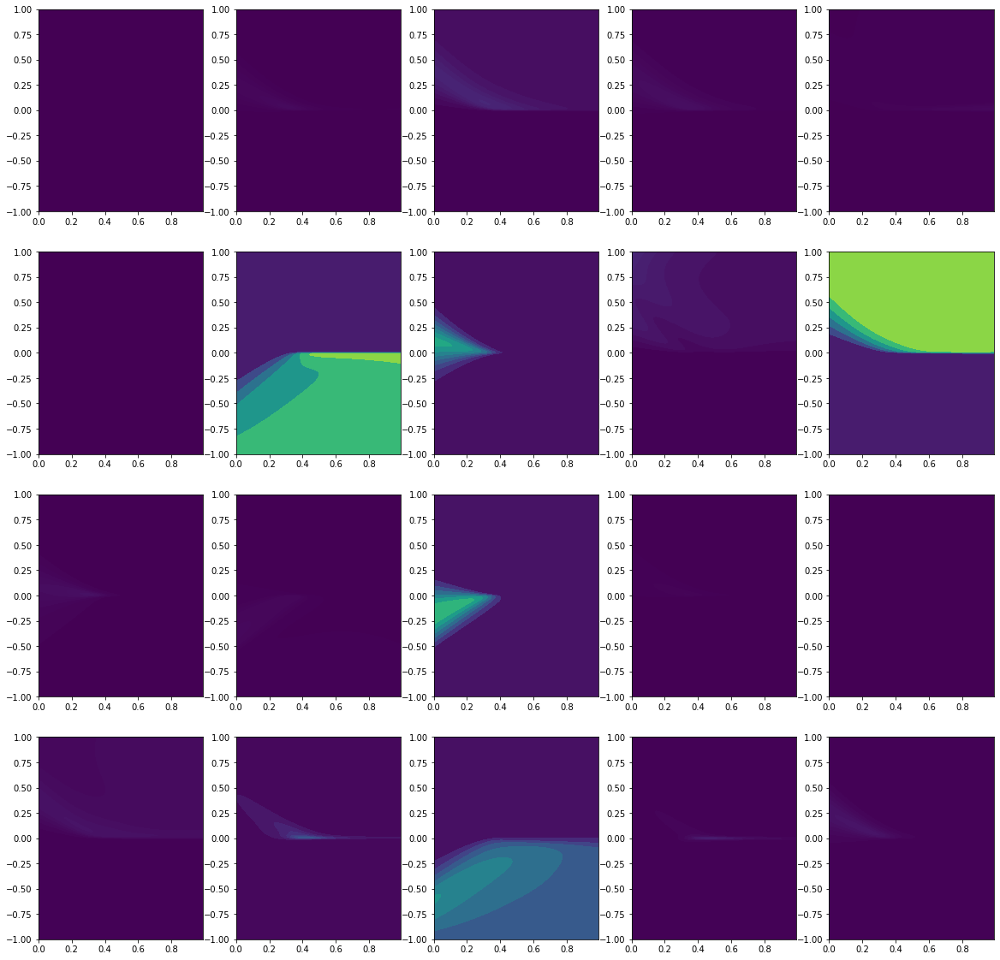

In [14]:
mesh_functions = model.get_probs(X_true)

fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], mesh_functions[:,row*5 + col],vmin=0,vmax=1)

In [4]:
model = Burgers_Domain_Transformer(lower_bound,upper_bound,20,6,.01/np.pi)

In [5]:
model.train_BFGS(X,U,X_df,True)

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: 0.000004
  Number of iterations: 5831
  Number of functions evaluations: 6289


In [6]:
U_hat = model.predict(X_true)

print( np.sqrt(np.mean((U_true[:,0] - U_hat[:,0])**2)) )
print( np.linalg.norm(U_true-U_hat,2)/np.linalg.norm(U_true,2))

0.0017747218620846963
0.002888838499634843


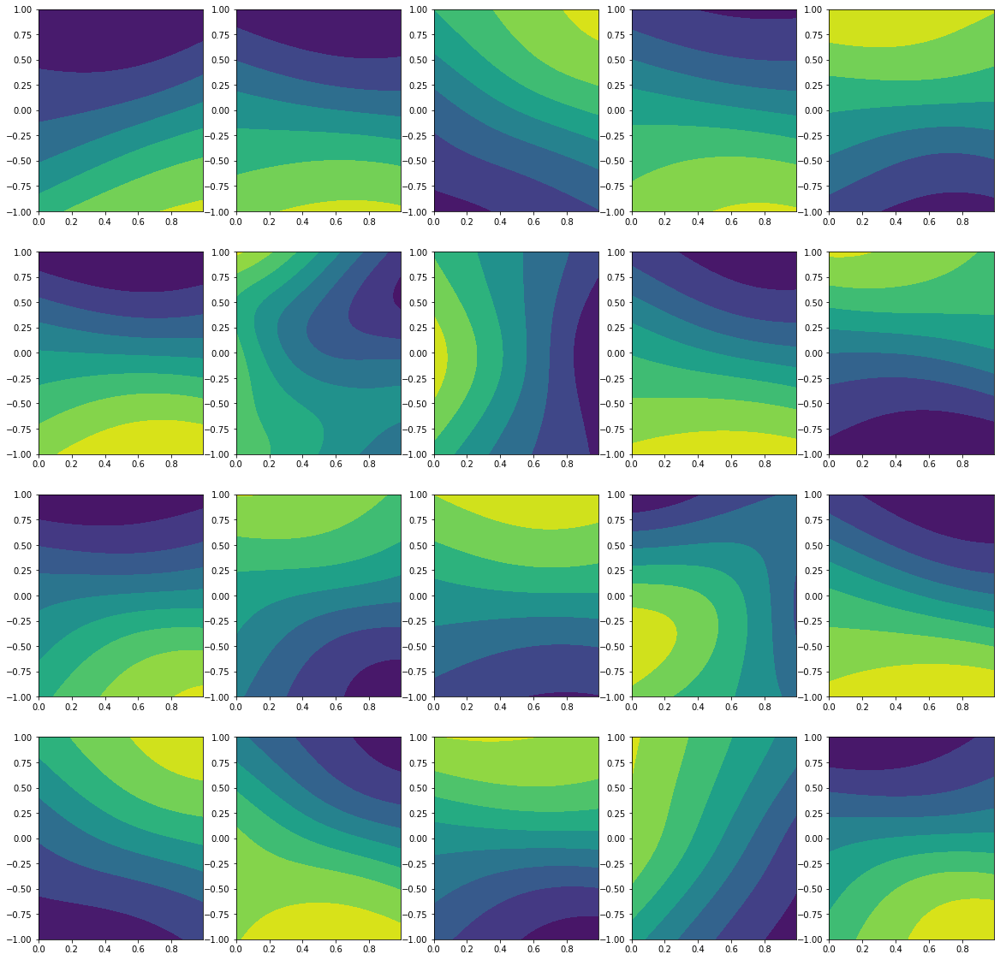

In [11]:
T1 = model.get_T1(X_true)

fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], T1[:,row*5 + col])

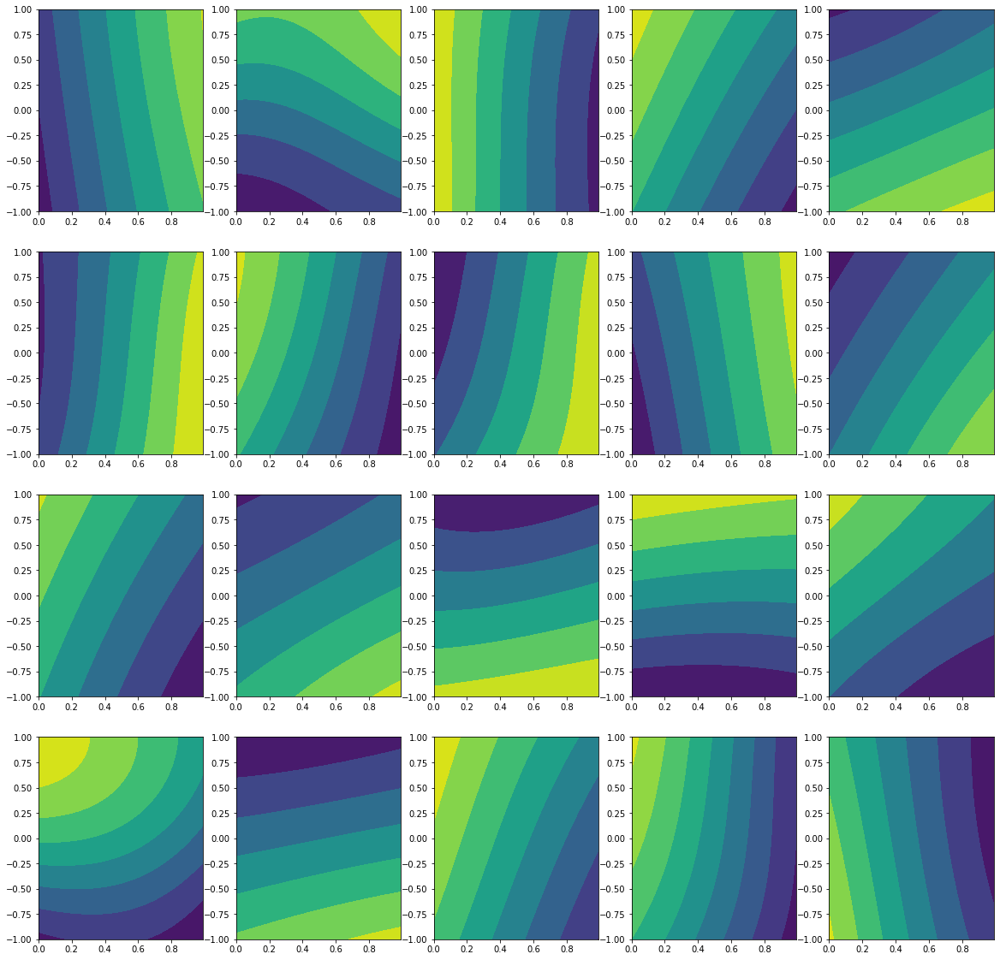

In [12]:
T2 = model.get_T2(X_true)

fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], T2[:,row*5 + col])

In [14]:
activations = model.get_activations(X_true)

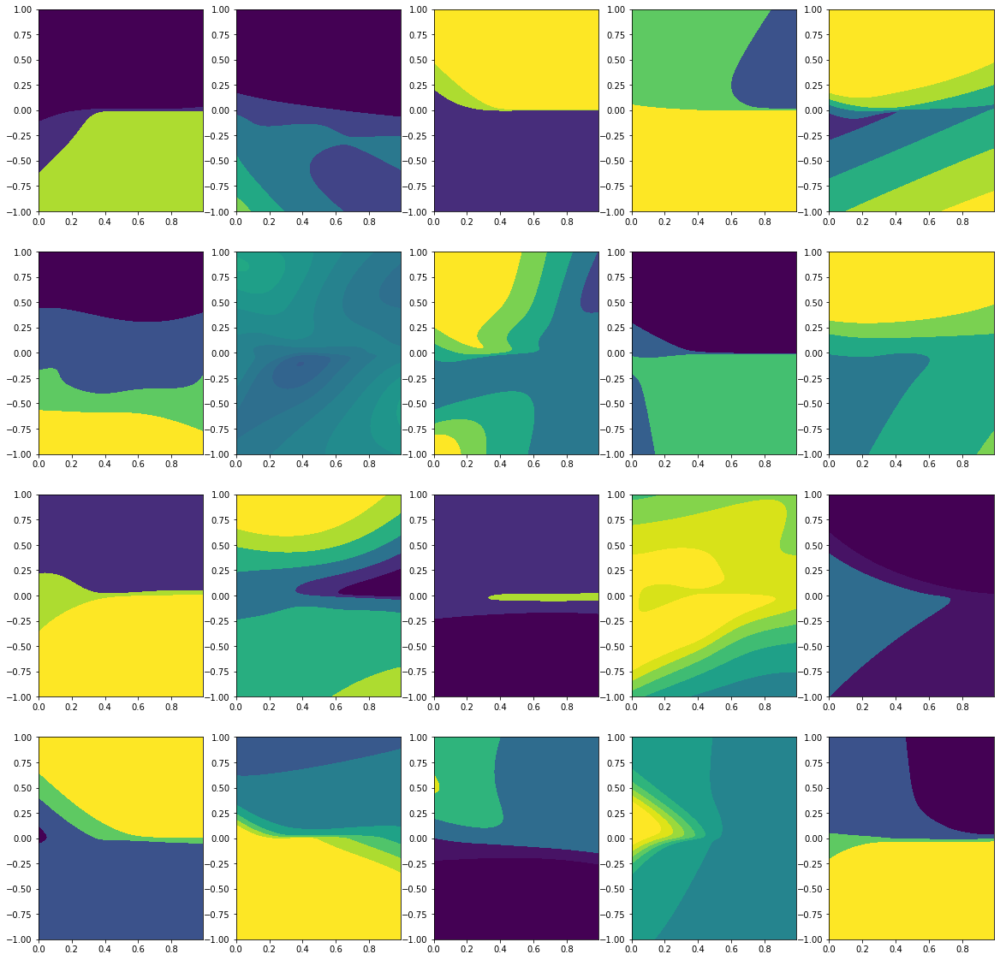

In [21]:
fig, axes = plt.subplots(4,5, figsize=(20,20))

for row in range(4):
    for col in range(5):
        axes[row,col].tricontourf(X_true[:,1], X_true[:,0], activations[-2][:,row*5 + col], vmin=-1, vmax=1)